In [1]:
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy
from classy import Class
from matplotlib.lines import Line2D
from smt.sampling_methods import LHS
from matplotlib.pyplot import cm
from uqpylab import sessions
from scipy.interpolate import interp1d
from scipy.spatial.distance import pdist
import statistics as st
import os, sys, warnings
from configparser import ConfigParser
from itertools import chain
import math
import seaborn as sns
from collections import defaultdict

def nested_dict(n, type):
    if n == 1:
        return defaultdict(type)
    else:
        return defaultdict(lambda: nested_dict(n-1, type))
    
data_kgb = nested_dict(5, list)
data_kev = nested_dict(5, list)

data_kgb_l = nested_dict(5, list)
data_kgb_s = nested_dict(5, list)

import os

# Where to save the figures

IMAGES_PATH = './images'
os.makedirs(IMAGES_PATH, exist_ok=True)

def save_fig(fig_id, tight_layout=True, fig_extension="pdf", resolution=180):
    path = os.path.join(IMAGES_PATH, fig_id + "." + fig_extension)
    print("Saving figure", fig_id)
        # Optimized save settings
    plt.savefig(path, 
               format=fig_extension,
               dpi=resolution,
               bbox_inches='tight',
               pad_inches=0.1,  # Reduced padding
               #optimize=True,    # Enable optimization
               metadata={'CreationDate': None}  # Remove metadata
               )  # Rasterize complex elements

/home/ahmad/anaconda3/lib/python3.9/site-packages/scipy/__init__.py:155: UserWarning: A NumPy version >=1.18.5 and <1.25.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


# KGB-evolution

In [2]:
# ──────────────────────────────────────────────────────────────────────────────
#                       CONFIGURATION FLAG
use_all_sims = False  # ← set to False to process *only* sim1, True to combine 3
show_sim_plots = True  # ← set to False if you dont want to see the simulation plots,
kgb_sim_data = True
# ──────────────────────────────────────────────────────────────────────────────

# 1) PARAMETERS FOR YOUR SIMULATIONS
sim1 = dict(path="/home/ahmad/kgb-master/data/snapshots-ab=0.04/", ngrid=1200, boxsize=800)

# sim1 = dict(path='/home/ahmad/kgb-master/data/3072-4000-ab=0/',
#             ngrid=3072, boxsize=4000)
sim2 = dict(path="/home/ahmad/kgb-master/data/4096-15000/", ngrid=4096, boxsize=15000)
# sim3 = dict(path='/home/ahmad/kgb-master/data/3072-8500/',
#             ngrid=3072, boxsize=8500)

sim3 = dict(path="/home/ahmad/kgb-master/data/3072-4000/", ngrid=3072, boxsize=4000)

# which simulations to stitch?
sims = [sim1]
if use_all_sims:
    sims += [sim2, sim3]


################################################################################################################
#                                              background file
if kgb_sim_data:
    with open(f"{sim1['path']}/file_background.dat") as f:
        lines = f.readlines()

    fourpiG_val = float(
        next(
            line.split("=")[1].strip() for line in lines if line.startswith("# fourpiG")
        )
    )
    H0_val = float(
        next(
            line.split("=")[1].strip()
            for line in lines
            if line.startswith("# H0[1/Mpc]")
        )
    )

    norm_kgb = np.sqrt(2 * fourpiG_val / 3) / H0_val

    bg_kgb = np.loadtxt(f"{sim1['path']}/file_background.dat")

    # scale factor and redshift
    a_kgb = bg_kgb[:, 2]
    z_kgb = bg_kgb[:, 3]

    # z_kgb = [0 if x < 0 else x for x in z_kgb]
    # z_kgb[-2], z_kgb[-1] = 0.01, 0

    # Conformal Hubble parameter and its derivative
    Hconf_kgb = bg_kgb[:, 5]
    Hconf_prime_kgb = bg_kgb[:, 6]
    Hconf_prime_prime_kgb = bg_kgb[:, 7]

    # alpha parameters and their derivatives
    alpha_K_kgb = bg_kgb[:, 17]
    alpha_B_kgb = bg_kgb[:, 18]
    alpha_K_prime_kgb = bg_kgb[:, 19]
    alpha_B_prime_kgb = bg_kgb[:, 20]

    # dark energy density and pressure and their derivatives
    rho_smg_kgb = bg_kgb[:, 13]
    p_smg_kgb = bg_kgb[:, 14]
    rho_smg_prime_kgb = bg_kgb[:, 15]
    p_smg_prime_kgb = bg_kgb[:, 16]
    cs2_kgb = bg_kgb[:, 21]

    H_hiclass = bg_kgb[:, 4]

    # other background values
    rho_cdm_kgb = bg_kgb[:, 8]
    rho_b_kgb = bg_kgb[:, 9]
    rho_crit_kgb = bg_kgb[:, 12]

############################################################################################################
#                                         hiclass ini parameters

parser = ConfigParser()
with open(f"{sim1['path']}/file_classparameters.ini") as lines:
    lines = chain(
        ("[top]",), lines
    )  # This line produce a fake section header called top
    parser.read_file(lines)

Omega_fld = float(parser.get("top", "Omega_fld"))
Omega_Lambda = float(parser.get("top", "Omega_Lambda"))
Omega_smg = float(parser.get("top", "Omega_smg"))

Omega_b = float(parser.get("top", "Omega_b"))
Omega_cdm = float(parser.get("top", "Omega_cdm"))
Omega_g = float(parser.get("top", "Omega_g"))
Omega_ur = float(parser.get("top", "Omega_ur"))

# Extract and parse the 'parameters_smg' string
expansion_smg_str = parser.get("top", "expansion_smg")
expansion_smg_list = expansion_smg_str.split(",")
Omega_kgb = float(expansion_smg_list[0].strip())

expansion_model_str = parser.get("top", "expansion_model")

############################################################################################################
#                                   KGB-evolution used.ini parameters

with open(f"{sim1['path']}/file_settings_used.ini") as lines:
    lines = chain(
        ("[top]",), lines
    )  # This line produce a fake section header called top
    parser.read_file(lines)

k_pivot = float(parser.get("top", "k_pivot"))
A_s = float(parser.get("top", "A_s"))
n_s = float(parser.get("top", "n_s"))
h = float(parser.get("top", "h"))

omega_b = float(parser.get("top", "omega_b"))
omega_cdm = float(parser.get("top", "omega_cdm"))


gravity_model = parser.get("top", "gravity_model")

# Extract and parse the 'parameters_smg' string
parameters_smg_str = parser.get("top", "parameters_smg")
parameters_smg_list = parameters_smg_str.split(",")

# Convert the first two parameters to floats
alpha_K_hat = float(parameters_smg_list[0].strip())
alpha_B_hat = float(parameters_smg_list[1].strip())


# Function to format numbers for LaTeX (reusing the previous function)
def format_scientific_latex(number):
    mantissa, exponent = f"{number:.1e}".split("e")
    exponent = exponent.lstrip("+").lstrip("0") or "0"
    return f"{mantissa} \\times 10^{{{exponent}}}"


# Format the alpha values
alpha_K_hat_latex = format_scientific_latex(alpha_K_hat)

# Extract and parse the 'parameters_smg' string
expansion_smg_str = parser.get("top", "expansion_smg")
expansion_smg_list = expansion_smg_str.split(",")

w_kgb = float(expansion_smg_list[0].strip())
w_a_kgb = float(expansion_smg_list[1].strip())

# n_kgb_numsteps   = float(parser.get("top", "n_kgb_numsteps"))
Courant_factor = float(parser.get("top", "Courant factor"))

#############################################################################################################3


##################################################################################
#                                                                                #
#                                                                                #
#                                 LINKING SIMULATIONS                            #
#                                                                                #
#                                                                                #
##################################################################################


# common list of P(k) suffixes
pknames = [
    "delta_kgb",
    "delta",
    "phi",
    "phi_prime",
    "pi_k",
    "zeta",
    "deltakgb_deltam",
]

# read your redshifts once (always from sim1’s ini)
z = []
with open(f"{sim1['path']}/file_settings_used.ini") as f:
    for line in f:
        if line.strip().startswith("Pk redshifts"):
            z = [float(x) for x in line.split("=")[1].split("#")[0].split(",")]
            break


def load_simulation(path, z, pknames):
    data = {name: [] for name in ["k"] + pknames}
    for i in range(len(z)):
        idx = f"{i:02d}"
        got_k = False
        for name in pknames:
            arr = np.loadtxt(f"{path}/pk_0{idx}_{name}.dat")
            if not got_k:
                data["k"].append(arr[:, 0])
                got_k = True
            data[name].append(arr[:, 1])
    return data


def trim_snapshot(k, fields, ngrid, boxsize, remove_first=5, nyquist_frac=1 / 13):
    kny = np.pi * ngrid / boxsize
    cutoff = nyquist_frac * kny
    iend = np.argmax(k > cutoff)
    keep = slice(remove_first, iend)
    k_trimmed = k[keep]
    return k_trimmed, {name: arr[keep] for name, arr in fields.items()}


# load whichever sims are needed
data1 = load_simulation(sim1["path"], z, pknames)
if use_all_sims:
    data2 = load_simulation(sim2["path"], z, pknames)
    data3 = load_simulation(sim3["path"], z, pknames)

# prepare output
final = {name: [] for name in ["k"] + pknames}

for iz in range(len(z)):
    # always trim sim1 with the default (remove_first=5, nyquist_frac=1/13)
    k_acc, f_acc = trim_snapshot(
        data1["k"][iz],
        {n: data1[n][iz] for n in pknames},
        sim1["ngrid"],
        sim1["boxsize"],
    )

    if use_all_sims:
        # sim2: remove_first=3, nyquist_frac=1/10
        k2, f2 = trim_snapshot(
            data2["k"][iz],
            {n: data2[n][iz] for n in pknames},
            sim2["ngrid"],
            sim2["boxsize"],
            remove_first=3,
            nyquist_frac=1 / 13,
        )
        j2 = np.searchsorted(k2, k_acc[-1], side="right")
        k_acc = np.concatenate([k_acc, k2[j2:]])
        for name in pknames:
            f_acc[name] = np.concatenate([f_acc[name], f2[name][j2:]])

        # sim3: remove_first=23, nyquist_frac=0.5
        k3, f3 = trim_snapshot(
            data3["k"][iz],
            {n: data3[n][iz] for n in pknames},
            sim3["ngrid"],
            sim3["boxsize"],
            remove_first=23,
            nyquist_frac=0.5,
        )
        j3 = np.searchsorted(k3, k_acc[-1], side="right")
        k_acc = np.concatenate([k_acc, k3[j3:]])
        for name in pknames:
            f_acc[name] = np.concatenate([f_acc[name], f3[name][j3:]])

    # store result for this redshift
    final["k"].append(k_acc)
    for name in pknames:
        final[name].append(f_acc[name])
        
        
#########################################################################################################
#                                                  mu function

rho_smg_f = interp1d(z_kgb,rho_smg_kgb, kind = 'cubic' )
rho_cdm_f = interp1d(z_kgb,rho_cdm_kgb, kind = 'cubic' )
rho_b_f = interp1d(z_kgb,rho_b_kgb, kind = 'cubic' )
rho_crit_f = interp1d(z_kgb,rho_crit_kgb, kind = 'cubic' )

# 2) Initialize the mu list in your final dict
final["mu"] = [None] * len(z)

# 3) Now compute mu for each redshift index
for zind, z_val in enumerate(z):
    delta_kgb = final["delta_kgb"][zind]
    delta_m   = final["delta"][zind]
    # note: ensure delta arrays are positive before sqrt
    final["mu"][zind] = 1 + rho_smg_f(z_val) * np.sqrt(delta_kgb) / (
        (rho_cdm_f(z_val) + rho_b_f(z_val)) * np.sqrt(delta_m)
    )
    
#########################################################################################################
#                                matter power spectrum normalization to hiclass 

# normalize the ‘delta’ spectrum always
for iz in range(len(z)):
    ktot = final["k"][iz]
    norm = (2 * np.pi**2) / (ktot**3)
    final["delta"][iz] *= norm




# Done: if use_all_sims=False you'll have only sim1 trimmed;
# if True you get the 3-sim stitch as before.

# k-evolution

In [3]:
import numpy as np
from configparser import ConfigParser

from itertools import chain

# Configuration Flags for K-essence
use_all_sims_kess = False  # False to process only sim1_kess, True to stitch all three
show_sim_plots_kess = True  # Toggle simulation plots
kess_sim_data = True  # Load background data

# 1) Simulation Definitions for K-essence
sim1_kess = dict(
    path="/home/ahmad/kgb-master/data/snapshots-kess/", ngrid=1200, boxsize=800
)
sim2_kess = dict(
    path="/home/ahmad/kgb-master/data/4096-15000-ab=0/", ngrid=4096, boxsize=15000
)
sim3_kess = dict(
    path="/home/ahmad/kgb-master/data/3072-4000-ab=0/", ngrid=3072, boxsize=4000
)

# Select which simulations to stitch
sims_kess = [sim1_kess]
if use_all_sims_kess:
    sims_kess += [sim2_kess, sim3_kess]

# Load background quantities from sim1_kess
if kess_sim_data:
    with open(f"{sim1_kess['path']}/file_background.dat") as f:
        lines = f.readlines()

    fourpiG_val_kess = float(
        next(
            line.split("=")[1].strip() for line in lines if line.startswith("# fourpiG")
        )
    )
    H0_val_kess = float(
        next(
            line.split("=")[1].strip()
            for line in lines
            if line.startswith("# H0[1/Mpc]")
        )
    )
    norm_kess = np.sqrt(2 * fourpiG_val_kess / 3) / H0_val_kess

    bg_kess = np.loadtxt(f"{sim1_kess['path']}/file_background.dat")
    a_kess = bg_kess[:, 2]
    z_kess_bg = bg_kess[:, 3]
    Hconf_kess = bg_kess[:, 5]
    Hconf_prime_kess = bg_kess[:, 6]
    Hconf_prime_prime_kess = bg_kess[:, 7]

    alpha_K_kess = bg_kess[:, 17]
    alpha_B_kess = bg_kess[:, 18]
    alpha_K_prime_kess = bg_kess[:, 19]
    alpha_B_prime_kess = bg_kess[:, 20]

    rho_smg_kess = bg_kess[:, 13]
    p_smg_kess = bg_kess[:, 14]
    rho_smg_prime_kess = bg_kess[:, 15]
    p_smg_prime_kess = bg_kess[:, 16]
    cs2_kess = bg_kess[:, 21]

    H_hiclass_kess = bg_kess[:, 4]
    rho_cdm_kess = bg_kess[:, 8]
    rho_b_kess = bg_kess[:, 9]
    
    rho_crit_kess = bg_kess[:, 12]


# Read INI parameters (class settings) from sim1_kess
parser_kess = ConfigParser()
with open(f"{sim1_kess['path']}/file_classparameters.ini") as lines:
    lines = chain(("[top]",), lines)
    parser_kess.read_file(lines)

Omega_fld_kess = float(parser_kess.get("top", "Omega_fld"))
Omega_Lambda_kess = float(parser_kess.get("top", "Omega_Lambda"))
Omega_smg_kess = float(parser_kess.get("top", "Omega_smg"))
Omega_b_kess = float(parser_kess.get("top", "Omega_b"))
Omega_cdm_kess = float(parser_kess.get("top", "Omega_cdm"))
Omega_g_kess = float(parser_kess.get("top", "Omega_g"))
Omega_ur_kess = float(parser_kess.get("top", "Omega_ur"))

# Read evolution settings (KGB-evolution) from sim1_kess
with open(f"{sim1_kess['path']}/file_settings_used.ini") as lines:
    lines = chain(("[top]",), lines)
    parser_kess.read_file(lines)

k_pivot_kess = float(parser_kess.get("top", "k_pivot"))
A_s_kess = float(parser_kess.get("top", "A_s"))
n_s_kess = float(parser_kess.get("top", "n_s"))
h_kess = float(parser_kess.get("top", "h"))
omega_b_kess = float(parser_kess.get("top", "omega_b"))
omega_cdm_kess = float(parser_kess.get("top", "omega_cdm"))

params_smg_kess = parser_kess.get("top", "parameters_smg").split(",")
alpha_K_hat_kess = float(params_smg_kess[0].strip())
alpha_B_hat_kess = float(params_smg_kess[1].strip())

# Common list of P(k) suffixes
pknames_kess = [
    "delta_kgb",
    "delta",
    "phi",
    "phi_prime",
    "pi_k",
    "zeta",
    "deltakgb_deltam",
]

# Read redshifts (always from sim1_kess)
z_kess = []
with open(f"{sim1_kess['path']}/file_settings_used.ini") as f:
    for line in f:
        if line.strip().startswith("Pk redshifts"):
            z_kess = [float(x) for x in line.split("=")[1].split("#")[0].split(",")]
            break

# Function to load simulation data
def load_sim_kess(path, z, pknames):
    data = {name: [] for name in ["k"] + pknames}
    for i in range(len(z)):
        idx = f"{i:02d}"
        got_k = False
        for name in pknames:
            arr = np.loadtxt(f"{path}/pk_0{idx}_{name}.dat")
            if not got_k:
                data["k"].append(arr[:, 0])
                got_k = True
            data[name].append(arr[:, 1])
    return data


# Function to trim simulation snapshots
def trim_snap_kess(k, fields, ngrid, boxsize, remove_first=5, nyquist_frac=1/ 13):
    kny = np.pi * ngrid / boxsize
    cutoff = nyquist_frac * kny
    iend = np.argmax(k > cutoff)
    keep = slice(remove_first, iend)
    return k[keep], {name: arr[keep] for name, arr in fields.items()}


# Load and stitch P(k) data
data1_kess = load_sim_kess(sim1_kess["path"], z_kess, pknames_kess)
if use_all_sims_kess:
    data2_kess = load_sim_kess(sim2_kess["path"], z_kess, pknames_kess)
    data3_kess = load_sim_kess(sim3_kess["path"], z_kess, pknames_kess)

final_kess = {name: [] for name in ["k"] + pknames_kess}
for iz in range(len(z_kess)):
    k_acc, f_acc = trim_snap_kess(
        data1_kess["k"][iz],
        {n: data1_kess[n][iz] for n in pknames_kess},
        sim1_kess["ngrid"],
        sim1_kess["boxsize"],
    )
    if use_all_sims_kess:
        k2, f2 = trim_snap_kess(
            data2_kess["k"][iz],
            {n: data2_kess[n][iz] for n in pknames_kess},
            sim2_kess["ngrid"],
            sim2_kess["boxsize"],
            remove_first=3,
            nyquist_frac=1 / 13,
        )
        j2 = np.searchsorted(k2, k_acc[-1], side="right")
        k_acc = np.concatenate([k_acc, k2[j2:]])
        for name in pknames_kess:
            f_acc[name] = np.concatenate([f_acc[name], f2[name][j2:]])
        k3, f3 = trim_snap_kess(
            data3_kess["k"][iz],
            {n: data3_kess[n][iz] for n in pknames_kess},
            sim3_kess["ngrid"],
            sim3_kess["boxsize"],
            remove_first=23,
            nyquist_frac=0.5,
        )
        j3 = np.searchsorted(k3, k_acc[-1], side="right")
        k_acc = np.concatenate([k_acc, k3[j3:]])
        for name in pknames_kess:
            f_acc[name] = np.concatenate([f_acc[name], f3[name][j3:]])
    final_kess["k"].append(k_acc)
    for name in pknames_kess:
        final_kess[name].append(f_acc[name])
        
 #########################################################################################################
#                                                  mu function

rho_smg_f  = interp1d(z_kess_bg,rho_smg_kess, kind = 'cubic' )
rho_cdm_f  = interp1d(z_kess_bg,rho_cdm_kess, kind = 'cubic' )
rho_b_f    = interp1d(z_kess_bg,rho_b_kess, kind = 'cubic' )
rho_crit_f = interp1d(z_kess_bg,rho_crit_kess, kind = 'cubic' )


# 2) Initialize the mu list in your final dict
final_kess["mu"] = [None] * len(z)

# 3) Now compute mu for each redshift index
for zind, z_val in enumerate(z):
    delta_kgb = final_kess["delta_kgb"][zind]
    delta_m   = final_kess["delta"][zind]
    # note: ensure delta arrays are positive before sqrt
    final_kess["mu"][zind] = 1 + (rho_smg_f(z_val) * np.sqrt(delta_kgb)) / (
        (rho_cdm_f(z_val) + rho_b_f(z_val)) * np.sqrt(delta_m))
       
#########################################################################################################
#                                matter power spectrum normalization to hiclass         
    
# Normalize the 'delta' spectrum for K-essence
for iz in range(len(z_kess)):
    ktot_kess = final_kess["k"][iz]
    norm_factor = (2 * np.pi**2) / (ktot_kess**3)
    final_kess["delta"][iz] *= norm_factor
    


In [4]:
#alpha_B_hat  = 0.05

# hiclass KGB

In [5]:
# z = [50,2,1,0.0]

####################################################################################################
#                                                just for hiclass
if show_sim_plots == False:
    kk = np.logspace(-3.2, np.log10(10), 1000)  # k in h/Mpc

    alpha_K_hat = 3e+03
    alpha_B_hat = 3.75
    
else:
    kk = ktot
    
#####################################################################################################


def a(x):
    return 1/(1+x)


Pk_m_kgb = [None] * len(z)
Pk_smg_kgb = [None] * len(z)

Pk_phi_kgb = [None] * len(z)
Pk_phi_prime_kgb = [None] * len(z)


Pk_pi_k_kgb = [None] * len(z)
Pk_zeta_kgb = [None] * len(z)

mu_kgb = [None] * len(z)

#######################################################################################
#                                               KGB settings
kgb_settings = {
    "Omega_smg": Omega_smg,
    "Omega_Lambda": Omega_Lambda,
    "Omega_fld": Omega_fld,
    "h": h,
    "Omega_b": Omega_b,
    "Omega_cdm": Omega_cdm,
    "Omega_g":Omega_g,
    "Omega_ur":Omega_ur,
    "A_s": A_s,
    "n_s": n_s,
    "z_max_pk": 100,
    "gravity_model": f"{gravity_model}",
    "parameters_smg": f"{alpha_K_hat}, {alpha_B_hat}, 0, 0, 1",
    "expansion_model": expansion_model_str,
    "expansion_smg": f"{Omega_kgb},{w_kgb}, {w_a_kgb}",
    "extra metric transfer functions": "yes",
    "output": "dTk,vTk,mPk",
    "P_k_max_1/Mpc": 130,
}

M_kgb = Class()
M_kgb.set(kgb_settings)
M_kgb.compute()
######################################################################################


######################################################################################
#                                                 common parameters

#kk = np.logspace(-3.2, np.log10(10), 1000)  # k in h/Mpc
k_pivot = 0.05
h = M_kgb.h()
As = kgb_settings["A_s"]
ns = kgb_settings["n_s"]
Normalization = As * (kk / k_pivot) ** (ns - 1.0)

######################################################################################
#                                                    backgrounds

backgrounds = M_kgb.get_background()

rho_b = interp1d(backgrounds["z"], backgrounds["(.)rho_b"], kind="cubic")
rho_cdm = interp1d(backgrounds["z"], backgrounds["(.)rho_cdm"], kind="cubic")
rho_g = interp1d(backgrounds["z"], backgrounds["(.)rho_g"], kind="cubic")
rho_ur = interp1d(backgrounds["z"], backgrounds["(.)rho_ur"], kind="cubic")
rho_tot = interp1d(backgrounds["z"], backgrounds["(.)rho_tot"], kind="cubic")
rho_crit = interp1d(backgrounds["z"], backgrounds["(.)rho_crit"], kind="cubic")

H = interp1d(backgrounds["z"], backgrounds["H [1/Mpc]"], kind="cubic")
H_prime = interp1d(backgrounds["z"], backgrounds["H_prime"], kind="cubic")


rho_smg = interp1d(backgrounds["z"], backgrounds["(.)rho_smg"], kind="cubic")
rho_smg_prime = interp1d(backgrounds["z"], backgrounds["(.)rho_smg_prime"], kind="cubic")
p_smg = interp1d(backgrounds["z"], backgrounds["(.)p_smg"], kind="cubic")
alpha_K = interp1d(backgrounds["z"], backgrounds["kineticity_smg"], kind="cubic")
alpha_B = interp1d(backgrounds["z"], backgrounds["braiding_smg"], kind="cubic")

a_hi = 1.0 / (1.0 + backgrounds["z"])
a_hiclass = interp1d(backgrounds["z"], a_hi, kind="cubic")
z_hi = backgrounds["z"]

Hconf = interp1d(backgrounds["z"], backgrounds["H [1/Mpc]"] * a_hi)
Hconf_prime = interp1d(
    backgrounds["z"],
    (a_hi**2) * (backgrounds["H [1/Mpc]"] ** 2) + a_hi * backgrounds["H_prime"],
)

H0 = Hconf(0)
Mpl2 = 1 / (3.0 * H0** 2)

############################################################################################


for zind, z_val in enumerate(z):

    #######################################################################################
    #                                                 Transfer functions

    Transfers = M_kgb.get_transfer(z_val)

    #############
    delta_b = interp1d(
        Transfers["k (h/Mpc)"], Transfers["d_b"], kind="cubic"
    )
    theta_b = interp1d(
        Transfers["k (h/Mpc)"], Transfers["t_b"], kind="cubic"
    )
    #############
    #                         theta_cdm is zero in synchronous gauge
    delta_cdm = interp1d(
        Transfers["k (h/Mpc)"], Transfers["d_cdm"], kind="cubic"
    )
    #############
    delta_g = interp1d(
        Transfers["k (h/Mpc)"], Transfers["d_g"], kind="cubic"
    )
    theta_g = interp1d(
        Transfers["k (h/Mpc)"], Transfers["t_g"], kind="cubic"
    )
    #############
    delta_ur = interp1d(
        Transfers["k (h/Mpc)"], Transfers["d_ur"], kind="cubic"
    )
    theta_ur = interp1d(
        Transfers["k (h/Mpc)"], Transfers["t_ur"], kind="cubic"
    )
    #############

    delta_tot = interp1d(
        Transfers["k (h/Mpc)"], Transfers["d_tot"], kind="cubic"
    )

    theta_tot = interp1d(
        Transfers["k (h/Mpc)"], Transfers["t_tot"], kind="cubic"
    )

    phi = interp1d(Transfers["k (h/Mpc)"], Transfers["phi"], kind="cubic")
    phi_prime = interp1d(
        Transfers["k (h/Mpc)"], Transfers["phi_prime"], kind="cubic"
    )
    psi = interp1d(Transfers["k (h/Mpc)"], Transfers["psi"], kind="cubic")

    vx_smg = interp1d(Transfers["k (h/Mpc)"], Transfers["vx_smg"], kind="cubic")
    vx_prime_smg = interp1d(
        Transfers["k (h/Mpc)"], Transfers["vx_prime_smg"], kind="cubic"
    )
    eta = interp1d(Transfers["k (h/Mpc)"], Transfers["eta"], kind="cubic")
    eta_prime = interp1d(
        Transfers["k (h/Mpc)"], Transfers["eta_prime"], kind="cubic"
    )

    h_met = interp1d(Transfers["k (h/Mpc)"], Transfers["h"], kind="cubic")
    h_prime_met = interp1d(
        Transfers["k (h/Mpc)"], Transfers["h_prime"], kind="cubic"
    )


    tmp_m_kgb = []
    tmp_m_kgb_newt = []
    tmp_smg_kgb = []
    
    tmp_phi_kgb = []
    tmp_phi_prime_kgb = []
    
    tmp_pi_k_kgb = []
    tmp_zeta_kgb = []
    
    tmp_mu_kgb = []


    for k in kk:
        
        alpha = (h_prime_met(k) + 6.0 * eta_prime(k)) / (2.0 * k * k * h * h)
        alpha_prime = psi(k) - Hconf(z_val) * alpha

        pi_newt = -vx_smg(k) + alpha
        pi_prime_newt = -vx_prime_smg(k) + alpha_prime
        zeta_newt = Hconf(z_val) * pi_newt + pi_prime_newt - psi(k)

        delta_smg_newt = -1 * (  # the -1 is for the fact that all the density contrast in hiclass are negatives.
            (Mpl2 / a(z_val) ** 2)
            * (
                -alpha_B(z_val) * Hconf(z_val) * ((k * h) ** 2) * pi_newt
                + 3 * alpha_B(z_val) * (Hconf(z_val) ** 2) * psi(k)
                - (3 * alpha_B(z_val) + alpha_K(z_val))
                * (Hconf(z_val) ** 2)
                * zeta_newt
                + 3 * alpha_B(z_val) * Hconf(z_val) * phi_prime(k)
            )
            + (
                (Mpl2 * alpha_B(z_val) / (a(z_val) ** 2))
                * (Hconf_prime(z_val) - Hconf(z_val) ** 2)
                + ((rho_smg(z_val) + p_smg(z_val)) / H0**2)
            )
            * 3
            * Hconf(z_val)
            * pi_newt
        ) / (rho_smg(z_val) / H0**2)
        
        
        # gauge transformation
        
        delta_smg_syn = delta_smg_newt + alpha * rho_smg_prime(z_val) / rho_smg(z_val)
        
        delta_cdm_newt = delta_cdm(k) - 3* alpha * Hconf(z_val)
        
        delta_b_newt = delta_b(k) - 3 * alpha * Hconf(z_val)
        
        delta_cdm_b_newt = (rho_cdm(z_val)*delta_cdm_newt+rho_b(z_val)*delta_b_newt)/(rho_cdm(z_val)+rho_b(z_val))
        
        tmp_m_kgb_newt.append((2* (np.pi**2)/((k)**3))*delta_cdm_b_newt**2)
        
        tmp_m_kgb.append(M_kgb.pk(k * h, z_val) * h**3)

        tmp_smg_kgb.append(delta_smg_newt**2)
        
        tmp_phi_kgb.append((k*h)*phi(k)**2)
        tmp_phi_prime_kgb.append((k*h)*phi_prime(k)**2)
        
        tmp_pi_k_kgb.append((k*h)**2 * pi_newt**2)
        tmp_zeta_kgb.append( zeta_newt**2)
        
        tmp_mu_kgb.append(1 + (rho_smg(z_val)*delta_smg_newt)/((rho_cdm(z_val)+rho_b(z_val))*delta_cdm_b_newt))
        
#########################################################################################################
#                                        Calculating Spectra
        
  ### matter power spectrum  

    # using transfer function
    Pk_m_kgb[zind] =  Normalization * tmp_m_kgb_newt
    
    # using the direct function
#     Pk_m_kgb[zind] = tmp_m_kgb

 #### DE power spectrum
    Pk_smg_kgb[zind] = Normalization * np.array(tmp_smg_kgb)
    
    # phi power spectrum
    Pk_phi_kgb[zind] =  Normalization * tmp_phi_kgb
    
    # phi_prime power spectrum
    Pk_phi_prime_kgb[zind] =  Normalization * tmp_phi_prime_kgb/H0**2
    
    # pi_k power spectrum
    Pk_pi_k_kgb[zind] =  Normalization * tmp_pi_k_kgb*(H0**2)
    
    # zeta power spectrum
    Pk_zeta_kgb[zind] =  Normalization * tmp_zeta_kgb
    
    # mu function
    mu_kgb[zind] =  tmp_mu_kgb
    
    

# hiclass k-essence

In [6]:
Pk_m_kess = [None] * len(z)
Pk_smg_kess = [None] * len(z)
delta_smg_kess = [None] * len(z)

Pk_phi_kess = [None] * len(z)
Pk_phi_prime_kess = [None] * len(z)

Pk_pi_k_kess = [None] * len(z)
Pk_zeta_kess = [None] * len(z)

mu_kess = [None] * len(z)

#######################################################################################
#                                               kessence settings

kess_settings = kgb_settings.copy()
kess_settings["parameters_smg"] = f"{alpha_K_hat}, 0, 0, 0, 1"
#kess_settings["use_ppf"] = "yes"
M_kess = Class()
M_kess.set(kess_settings)
M_kess.compute()

####################################################################################

######################################################################################
#                                                   backgrounds

backgrounds = M_kess.get_background()

rho_b = interp1d(backgrounds["z"], backgrounds["(.)rho_b"], kind="cubic")
rho_cdm = interp1d(backgrounds["z"], backgrounds["(.)rho_cdm"], kind="cubic")
rho_g = interp1d(backgrounds["z"], backgrounds["(.)rho_g"], kind="cubic")
rho_ur = interp1d(backgrounds["z"], backgrounds["(.)rho_ur"], kind="cubic")
rho_tot = interp1d(backgrounds["z"], backgrounds["(.)rho_tot"], kind="cubic")
rho_crit = interp1d(backgrounds["z"], backgrounds["(.)rho_crit"], kind="cubic")

H = interp1d(backgrounds["z"], backgrounds["H [1/Mpc]"], kind="cubic")
H_prime = interp1d(backgrounds["z"], backgrounds["H_prime"], kind="cubic")


rho_smg = interp1d(backgrounds["z"], backgrounds["(.)rho_smg"], kind="cubic")
rho_smg_prime = interp1d(backgrounds["z"], backgrounds["(.)rho_smg_prime"], kind="cubic")
p_smg = interp1d(backgrounds["z"], backgrounds["(.)p_smg"], kind="cubic")
alpha_K = interp1d(backgrounds["z"], backgrounds["kineticity_smg"], kind="cubic")
alpha_B = interp1d(backgrounds["z"], backgrounds["braiding_smg"], kind="cubic")

a_hi = 1.0 / (1.0 + backgrounds["z"])
a_hiclass = interp1d(backgrounds["z"], a_hi, kind="cubic")
z_hi = backgrounds["z"]

Hconf = interp1d(backgrounds["z"], backgrounds["H [1/Mpc]"] * a_hi)
Hconf_prime = interp1d(
    backgrounds["z"],
    (a_hi**2) * (backgrounds["H [1/Mpc]"] ** 2) + a_hi * backgrounds["H_prime"],
)

H0 = Hconf(0)
Mpl2 = 1 / (3.0 * H0** 2)


for zind, z_val in enumerate(z):

    #######################################################################################
    #                                                 Transfer functions

    Transfers = M_kess.get_transfer(z_val)

    #############
    delta_b = interp1d(
        Transfers["k (h/Mpc)"], Transfers["d_b"], kind="cubic"
    )
    theta_b = interp1d(
        Transfers["k (h/Mpc)"], Transfers["t_b"], kind="cubic"
    )
    #############
    #                         theta_cdm is zero in synchronous gauge
    delta_cdm = interp1d(
        Transfers["k (h/Mpc)"], Transfers["d_cdm"], kind="cubic"
    )
    #############
    delta_g = interp1d(
        Transfers["k (h/Mpc)"], Transfers["d_g"], kind="cubic"
    )
    theta_g = interp1d(
        Transfers["k (h/Mpc)"], Transfers["t_g"], kind="cubic"
    )
    #############
    delta_ur = interp1d(
        Transfers["k (h/Mpc)"], Transfers["d_ur"], kind="cubic"
    )
    theta_ur = interp1d(
        Transfers["k (h/Mpc)"], Transfers["t_ur"], kind="cubic"
    )
    #############

    delta_tot = interp1d(
        Transfers["k (h/Mpc)"], Transfers["d_tot"], kind="cubic"
    )

    theta_tot = interp1d(
        Transfers["k (h/Mpc)"], Transfers["t_tot"], kind="cubic"
    )

    phi = interp1d(Transfers["k (h/Mpc)"], Transfers["phi"], kind="cubic")
    phi_prime = interp1d(
        Transfers["k (h/Mpc)"], Transfers["phi_prime"], kind="cubic"
    )
    psi = interp1d(Transfers["k (h/Mpc)"], Transfers["psi"], kind="cubic")

    vx_smg = interp1d(Transfers["k (h/Mpc)"], Transfers["vx_smg"], kind="cubic")
    vx_prime_smg = interp1d(
        Transfers["k (h/Mpc)"], Transfers["vx_prime_smg"], kind="cubic"
    )
    eta = interp1d(Transfers["k (h/Mpc)"], Transfers["eta"], kind="cubic")
    eta_prime = interp1d(
        Transfers["k (h/Mpc)"], Transfers["eta_prime"], kind="cubic"
    )

    h_met = interp1d(Transfers["k (h/Mpc)"], Transfers["h"], kind="cubic")
    h_prime_met = interp1d(
        Transfers["k (h/Mpc)"], Transfers["h_prime"], kind="cubic"
    )


    tmp_m_kess_ = []
    tmp_m_kess_newt = []
    tmp_smg_kess = []
    
    tmp_phi_kess = []
    tmp_phi_prime_kess = []
        
    tmp_pi_k_kess = []
    tmp_zeta_kess = []
    
    tmp_mu_kess = []

    for k in kk:
        
        alpha = (h_prime_met(k) + 6.0 * eta_prime(k)) / (2.0 * k * k * h * h)
        alpha_prime = psi(k) - Hconf(z_val) * alpha

        pi_newt = -vx_smg(k) + alpha
        pi_prime_newt = -vx_prime_smg(k) + alpha_prime
        zeta_newt = Hconf(z_val) * pi_newt + pi_prime_newt - psi(k)

        delta_smg_newt = -1 *( # the -1 is for the fact that all the density contrast in hiclass are negatives.
            (Mpl2 / a(z_val) ** 2)
            * (
                -alpha_B(z_val) * Hconf(z_val) * ((k * h) ** 2) * pi_newt
                + 3 * alpha_B(z_val) * (Hconf(z_val) ** 2) * psi(k)
                - (3 * alpha_B(z_val) + alpha_K(z_val))
                * (Hconf(z_val) ** 2)
                * zeta_newt
                + 3 * alpha_B(z_val) * Hconf(z_val) * phi_prime(k)
            )
            + (
                (Mpl2 * alpha_B(z_val) / (a(z_val) ** 2))
                * (Hconf_prime(z_val) - Hconf(z_val) ** 2)
                + ((rho_smg(z_val) + p_smg(z_val)) / H0**2)
            )
            * 3
            * Hconf(z_val)
            * pi_newt
        ) / (rho_smg(z_val) / H0**2)
        
        
        # gauge transformation
        
        delta_smg_syn = delta_smg_newt + alpha * rho_smg_prime(z_val) / rho_smg(z_val)
        
        delta_cdm_newt = delta_cdm(k) - 3* alpha * Hconf(z_val)
        
        delta_b_newt = delta_b(k) - 3 * alpha * Hconf(z_val)
        
        delta_cdm_b_newt = (rho_cdm(z_val)*delta_cdm_newt+rho_b(z_val)*delta_b_newt)/(rho_cdm(z_val)+rho_b(z_val))
        
        tmp_m_kess_newt.append((2* (np.pi**2)/((k)**3))*delta_cdm_b_newt**2)
        
        #tmp_m_kess.append(M_kess.pk(k * h, z_val) * h**3)

        tmp_smg_kess.append(delta_smg_newt**2)
        
        tmp_phi_kess.append((k*h)*phi(k)**2)
        
        tmp_phi_prime_kess.append((k*h)*phi_prime(k)**2)
        
        tmp_pi_k_kess.append((k*h)**2 * pi_newt**2)
        tmp_zeta_kess.append( zeta_newt**2)
        
        tmp_mu_kess.append(1 + (rho_smg(z_val)*delta_smg_newt)/((rho_cdm(z_val)+rho_b(z_val))*delta_cdm_b_newt))
        
  ### matter power spectrum  
    Pk_m_kess[zind] = Normalization * tmp_m_kess_newt
    
 ### phi power spectrum  
    Pk_phi_kess[zind] = Normalization * tmp_phi_kess
    
 ### phi_prime power spectrum  
    Pk_phi_prime_kess[zind] = Normalization * tmp_phi_prime_kess/H0**2
    
 #### DE power spectrum
    Pk_smg_kess[zind] = Normalization * np.array(tmp_smg_kess)
    
  ####
#     delta_smg_kess[zind] = d_smg_kess
    
    # pi_k power spectrum
    Pk_pi_k_kess[zind] =  Normalization * tmp_pi_k_kess*(H0**2)
    
    # zeta power spectrum
    Pk_zeta_kess[zind] =  Normalization * tmp_zeta_kess
    
    mu_kess[zind] = tmp_mu_kess



# matter power spectrum

In [7]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.lines import Line2D
import matplotlib.ticker as mticker
from matplotlib.gridspec import GridSpec, GridSpecFromSubplotSpec

# —————————————————————————————
# Assumes the following variables are already defined:
# k_zp, kk                  : wave number arrays (per redshift)
# Pk_m_kess_zp             : linear spectra for k-essence
# Pk_m_kgb_zp              : linear spectra for KGB
# delta_kess_zp            : nonlinear spectra (k-essence)
# delta_zp                 : nonlinear spectra (KGB)
# colors                   : color list for plotting
# show_sim_plots           : bool, use simulation k-values if True
# alpha_K_hat, alpha_B_hat : model params for plot titles
# target_z                 : list of redshifts [2, 1, 0]
# save_fig                 : function to save the figure
# —————————————————————————————


plt.rc("text", usetex=True)
font = {"family": "normal", "weight": "bold", "size": 18}
colors = sns.color_palette("viridis", len(target_z)).as_hex()

# simulation
k_zp     = dict(zip(z, final['k']))
delta_zp = dict(zip(z, final['delta']))

# simulation kessence
delta_kess_zp = dict(zip(z, final_kess['delta']))


# hiclass
Pk_m_kgb_zp  = dict(zip(z, Pk_m_kgb))
Pk_m_kess_zp = dict(zip(z, Pk_m_kess))


# 2) Choose the redshifts you actually want to plot
target_z = [ 10, 5, 2, 0.08]

# Set global plot styles
plt.rc("text", usetex=True)
plt.rc("font", family="serif", size=25)
plt.rc('xtick', labelsize=20)
plt.rc('ytick', labelsize=20)

# Create figure
fig = plt.figure(figsize=(13, 17))

# Top-level 2x2 grid layout
outer_gs = GridSpec(
    nrows=2, ncols=2,
    height_ratios=[1, 1],
    width_ratios=[1, 1],
    hspace=0.19,
    wspace=0.0
)

# Panel titles and data functions
panels = [
    (
        fr"(a) $k$‐essence ($\alpha_\mathrm{{K}} = {alpha_K_hat}$):" + "\n" + "Linear vs Non-linear",
        lambda z: Pk_m_kess_zp[z],
        lambda z: delta_kess_zp[z]
    ),
    (
        fr"(b) KGB ($\alpha_\mathrm{{K}} = {alpha_K_hat},\,\alpha_\mathrm{{B}} = {alpha_B_hat}$):" + "\n" + "Linear vs Non-linear",
        lambda z: Pk_m_kgb_zp[z],
        lambda z: delta_zp[z]
    ),
    (
        r"(c) Linear: $k$‐essence vs KGB",
        lambda z: Pk_m_kess_zp[z],
        lambda z: Pk_m_kgb_zp[z]
    ),
    (
        r"(d) Non‐linear: $k$‐essence vs KGB",
        lambda z: delta_kess_zp[z],
        lambda z: delta_zp[z]
    )
]

# Share y-axes within each row
shared_spec_axes = [None, None]
shared_diff_axes = [None, None]

# Loop over each of the 4 panels
for idx, (panel_title, get_P1, get_P2) in enumerate(panels):
    row = idx // 2
    col = idx % 2

    # Inner 2x1 layout for each panel (top: spectrum, bottom: diff)
    inner_gs = GridSpecFromSubplotSpec(
        nrows=2, ncols=1,
        height_ratios=[3, 1],
        hspace=0.0,
        subplot_spec=outer_gs[row, col]
    )

    # Top subplot: power spectrum
    if shared_spec_axes[row] is None:
        ax_spec = fig.add_subplot(inner_gs[0])
        shared_spec_axes[row] = ax_spec
    else:
        ax_spec = fig.add_subplot(inner_gs[0], sharey=shared_spec_axes[row])

    # Bottom subplot: relative difference
    if shared_diff_axes[row] is None:
        ax_diff = fig.add_subplot(inner_gs[1], sharex=ax_spec)
        shared_diff_axes[row] = ax_diff
    else:
        ax_diff = fig.add_subplot(inner_gs[1], sharex=ax_spec, sharey=shared_diff_axes[row])

    # Plot lines for each redshift
    for color, z_val in zip(colors, target_z):
        k_vals = k_zp[z_val] if show_sim_plots else kk
        P1 = get_P1(z_val)
        P2 = get_P2(z_val)

        # Plot linear and nonlinear curves
        ax_spec.plot(k_vals, P1, '--', color=color, linewidth=2.1)
        ax_spec.plot(k_vals, P2, '-', label=rf"$z={z_val}$", color=color, linewidth=2.1)

        # Plot percent difference
        rel_diff = 100.0 * (1.0 - P1 / P2)
        ax_diff.plot(k_vals, rel_diff, '-', color=color, linewidth=2.1)

    # Formatting: top (spectrum)
    ax_spec.set_title(panel_title, fontsize=22, pad=8)
    ax_spec.set_xscale("log")
    ax_spec.set_yscale("log")
    ax_spec.grid(True, which="both", axis="both", linestyle="--", alpha=0.4)

    # Redshift legend (color lines)
    red_leg = ax_spec.legend(loc="upper right", fontsize=16)

    # Line style legend (dashed vs solid)
    handle_solid = Line2D([0], [0], linestyle='-', color='black')
    handle_dashed = Line2D([0], [0], linestyle='--', color='black')

    style_labels = (
        ["non-linear", "linear"] if idx < 2 else ["KGB", r"$k$-essence"]
    )

    ax_spec.legend(
        [handle_solid, handle_dashed],
        style_labels,
        loc="lower left",
        fontsize=16
    )
    ax_spec.add_artist(red_leg)

    # Formatting: bottom (difference)
    ax_diff.set_xscale("log")
    ax_diff.grid(True, which="both", axis="both", linestyle="--", alpha=0.4)
    ax_diff.axhspan(-1, 1, color="gray", alpha=0.3)
    ax_diff.axhspan(-2, 2, color="gray", alpha=0.2)
    ax_diff.yaxis.set_major_locator(mticker.MaxNLocator(nbins=5))

    # ✳️ Set fixed y-limits only for first row (panels a and b)
    if row == 0:
        ax_diff.set_ylim(-10, 10)

    # Only bottom row gets x-axis label
    ax_diff.set_xlabel(r"$k\,[h/\mathrm{Mpc}]$", fontsize=20)

    # Y-axis labels only on left column
    if col == 0:
        ax_spec.set_ylabel(r"$P_{\mathrm{m}}\,[\mathrm{Mpc}/h]^3$", fontsize=20)
        ax_diff.set_ylabel(
            r"$1 - P_\mathrm{m}^\mathrm{L}/P_m^\mathrm{NL}~[\%]$" if row == 0
            else r"$1 - P_\mathrm{m}^{k\mathrm{ess}}/P_m^\mathrm{KGB}~[\%]$",
            fontsize=20
        )
    else:
        ax_spec.tick_params(labelleft=False)
        ax_diff.tick_params(labelleft=False)

# Adjust final layout
fig.subplots_adjust(left=0.06, right=0.98, top=0.95, bottom=0.08)

# Save and show plot
#save_fig("all_four_panels_2x2_corrected")
plt.show()

NameError: name 'target_z' is not defined

# DE power spectrum

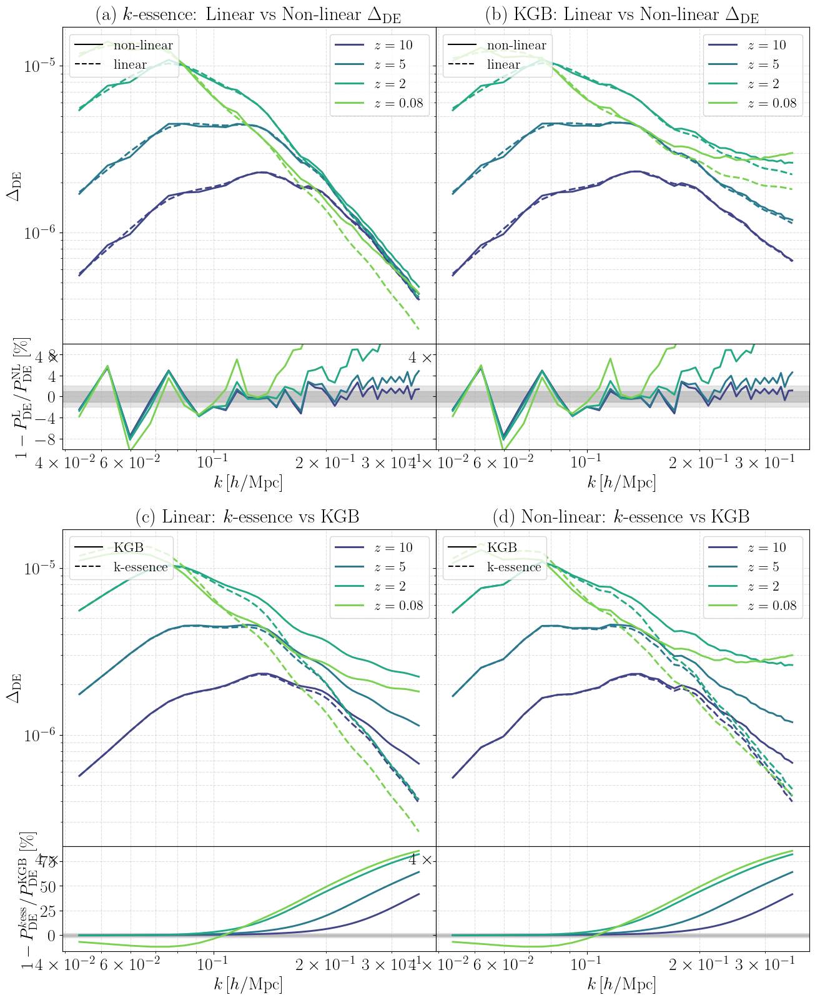

In [30]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.gridspec import GridSpec, GridSpecFromSubplotSpec
from matplotlib.lines import Line2D
import matplotlib.ticker as mticker

# Plot settings
plt.rc("text", usetex=True)
plt.rc("font", family="serif", size=25)
plt.rc("xtick", labelsize=20)
plt.rc("ytick", labelsize=20)

# Create figure
fig = plt.figure(figsize=(13, 17))
outer_gs = GridSpec(2, 2, hspace=0.19, wspace=0.0)



plt.rc("text", usetex=True)
font = {"family": "normal", "weight": "bold", "size": 18}

# simulation
k_zp     = dict(zip(z, final['k']))
delta_kgb_zp = dict(zip(z, final['delta_kgb']))

# simulation kessence
delta_kess_zp = dict(zip(z, final_kess['delta_kgb']))


# hiclass
Pk_smg_kgb_zp  = dict(zip(z, Pk_smg_kgb))
Pk_smg_kess_zp = dict(zip(z, Pk_smg_kess))


# 2) Choose the redshifts you actually want to plot
target_z = [ 10, 5, 2 ,0.08]

colors = sns.color_palette("viridis", len(target_z)).as_hex()

# Data getters
def get_de_kess(z): return Pk_smg_kess_zp[z]
def get_de_kgb(z): return Pk_smg_kgb_zp[z]
def get_de_kess_sim(z): return delta_kess_zp[z]
def get_de_kgb_sim(z): return delta_kgb_zp[z]

# Define the 4 panels
panels = [
    (
        fr"(a) $k$‐essence: Linear vs Non-linear $\Delta_\mathrm{{DE}}$",
        get_de_kess, get_de_kess_sim
    ),
    (
        fr"(b) KGB: Linear vs Non-linear $\Delta_\mathrm{{DE}}$",
        get_de_kgb, get_de_kgb_sim
    ),
    (
        r"(c) Linear: $k$‐essence vs KGB",
        get_de_kess, get_de_kgb
    ),
    (
        r"(d) Non-linear: $k$‐essence vs KGB",
        get_de_kess_sim, get_de_kgb_sim
    )
]

# Shared axes setup
shared_spec_axes = [None, None]
shared_diff_axes = [None, None]

# Loop over panels
for idx, (title, get_P1, get_P2) in enumerate(panels):
    row, col = divmod(idx, 2)

    inner_gs = GridSpecFromSubplotSpec(2, 1, height_ratios=[3, 1], hspace=0.0, subplot_spec=outer_gs[row, col])
    
    ax_spec = fig.add_subplot(inner_gs[0], sharey=shared_spec_axes[row]) if shared_spec_axes[row] is None else fig.add_subplot(inner_gs[0], sharey=shared_spec_axes[row])
    ax_diff = fig.add_subplot(inner_gs[1], sharex=ax_spec, sharey=shared_diff_axes[row]) if shared_diff_axes[row] is None else fig.add_subplot(inner_gs[1], sharex=ax_spec, sharey=shared_diff_axes[row])
    shared_spec_axes[row] = ax_spec
    shared_diff_axes[row] = ax_diff

    # Plot each redshift
    for color, z_val in zip(colors, target_z):
        k_vals = k_zp[z_val]
        P1 = get_P1(z_val)
        P2 = get_P2(z_val)

        ax_spec.plot(k_vals, P1, "--", color=color, linewidth=2.1)
        ax_spec.plot(k_vals, P2, "-", label=rf"$z={z_val}$", color=color, linewidth=2.1)

        rel_diff = 100.0 * (1.0 - np.array(P1) / np.array(P2))
        ax_diff.plot(k_vals, rel_diff, "-", color=color, linewidth=2.1)

    # Spectrum plot formatting
    ax_spec.set_title(title, fontsize=22, pad=8)
    ax_spec.set_xscale("log")
    ax_spec.set_yscale("log")
    ax_spec.grid(True, which="both", axis="both", linestyle="--", alpha=0.4)

    # Legends
    red_leg = ax_spec.legend(loc="upper right", fontsize=16)
    handles = [
        Line2D([0], [0], linestyle='-', color='black'),
        Line2D([0], [0], linestyle='--', color='black')
    ]
    style_labels = (
        ["non-linear", "linear"] if idx < 2 else ["KGB", "k-essence"]
    )
    ax_spec.legend(handles, style_labels, loc="upper left", fontsize=16)
    ax_spec.add_artist(red_leg)

    # Relative difference formatting
    ax_diff.set_xscale("log")
    ax_diff.grid(True, which="both", axis="both", linestyle="--", alpha=0.4)
    ax_diff.axhspan(-1, 1, color="gray", alpha=0.3)
    ax_diff.axhspan(-2, 2, color="gray", alpha=0.2)
    ax_diff.yaxis.set_major_locator(mticker.MaxNLocator(nbins=5))

    if row == 0:
        ax_diff.set_ylim(-10, 10)

    ax_diff.set_xlabel(r"$k\,[h/\mathrm{Mpc}]$", fontsize=20)

    # Y-labels only on left column
    if col == 0:
        ax_spec.set_ylabel(r"$\Delta_\mathrm{DE}$", fontsize=20)
        ax_diff.set_ylabel(
            r"$1 - P_\mathrm{DE}^\mathrm{L}/P_\mathrm{DE}^\mathrm{NL}~[\%]$" if row == 0
            else r"$1 - P_\mathrm{DE}^{k\mathrm{ess}}/P_\mathrm{DE}^\mathrm{KGB}~[\%]$",
            fontsize=20
        )
    else:
        ax_spec.tick_params(labelleft=False)
        ax_diff.tick_params(labelleft=False)

# Final layout tweaks
fig.subplots_adjust(left=0.06, right=0.98, top=0.95, bottom=0.08)

# Optional title (uncomment if needed)
# fig.suptitle(rf"$\hat{{\alpha}}_{{\mathrm{{K}}}} = {alpha_K_hat},\ \hat{{\alpha}}_{{\mathrm{{B}}}} = {alpha_B_hat}$", fontsize=22)

# save_fig("dark_energy_power_spectrum_2x2_layout")
plt.show()

# Snapshots

In [8]:
import h5py


snap_path_kess = "/home/ahmad/kgb-master/data/snapshots-kess/"
snap_path_kgb1 = "/home/ahmad/kgb-master/data/snapshots-ab=0.04/"
snap_path_kgb2 = "/home/ahmad/kgb-master/data/snapshots-ab=0.4/"

import h5py
import glob

# Define filename patterns for dark energy and matter snapshots

dark_kess = snap_path_kess+ '/snap_*_T00_kgb.h5'
dark_kgb1 = snap_path_kgb1 +'/snap_*_T00_kgb.h5'
dark_kgb2 = snap_path_kgb2 +'/snap_*_T00_kgb.h5'

matter = snap_path_kgb1 +'/snap_*_T00.h5'

# Collect and sort matching file paths

dark_files_kess = sorted(glob.glob(dark_kess))
dark_files_kgb1 = sorted(glob.glob(dark_kgb1))
dark_files_kgb2 = sorted(glob.glob(dark_kgb2))

matter_files = sorted(glob.glob(matter))

# # remove the first file from each list
# dark_files_kess   = dark_files_kess[1:]
# dark_files_kgb1   = dark_files_kgb1[1:]
# dark_files_kgb2   = dark_files_kgb2[1:]
# matter_files      = matter_files[1:]


# Open HDF5 files and store file objects in separate lists
dark_snapshots_kess = [h5py.File(f, 'r') for f in dark_files_kess]
dark_snapshots_kgb1 = [h5py.File(f, 'r') for f in dark_files_kgb1]
dark_snapshots_kgb2 = [h5py.File(f, 'r') for f in dark_files_kgb2]

matter_snapshots = [h5py.File(f, 'r') for f in matter_files]

# Example: Access a dataset from the first dark energy snapshot
# coords_dark = dark_snapshots[0]['PartType1/Coordinates'][:]
# coords_matter = matter_snapshots[0]['PartType1/Coordinates'][:]

# When you're done processing, remember to close all files:
# for f in dark_snapshots + matter_snapshots:
#     f.close()


print("Dark energy kess files loaded:", dark_files_kess)
print("Dark energy kgb files loaded:", dark_files_kgb1)
print("Dark energy kgb files loaded:", dark_files_kgb2)

print("Dark energy kess files loaded:", matter_files)

Dark energy kess files loaded: ['/home/ahmad/kgb-master/data/snapshots-kess/snap_000_T00_kgb.h5', '/home/ahmad/kgb-master/data/snapshots-kess/snap_001_T00_kgb.h5', '/home/ahmad/kgb-master/data/snapshots-kess/snap_002_T00_kgb.h5', '/home/ahmad/kgb-master/data/snapshots-kess/snap_003_T00_kgb.h5']
Dark energy kgb files loaded: ['/home/ahmad/kgb-master/data/snapshots-ab=0.04/snap_000_T00_kgb.h5', '/home/ahmad/kgb-master/data/snapshots-ab=0.04/snap_001_T00_kgb.h5', '/home/ahmad/kgb-master/data/snapshots-ab=0.04/snap_002_T00_kgb.h5', '/home/ahmad/kgb-master/data/snapshots-ab=0.04/snap_003_T00_kgb.h5']
Dark energy kgb files loaded: ['/home/ahmad/kgb-master/data/snapshots-ab=0.4/snap_000_T00_kgb.h5', '/home/ahmad/kgb-master/data/snapshots-ab=0.4/snap_001_T00_kgb.h5', '/home/ahmad/kgb-master/data/snapshots-ab=0.4/snap_002_T00_kgb.h5', '/home/ahmad/kgb-master/data/snapshots-ab=0.4/snap_003_T00_kgb.h5']
Dark energy kess files loaded: []


/tmp/ipykernel_126336/2903072169.py:61: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/tmp/ipykernel_126336/2903072169.py:95: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/tmp/ipykernel_126336/2903072169.py:131: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



Saving figure snapshots_DE_zoomed


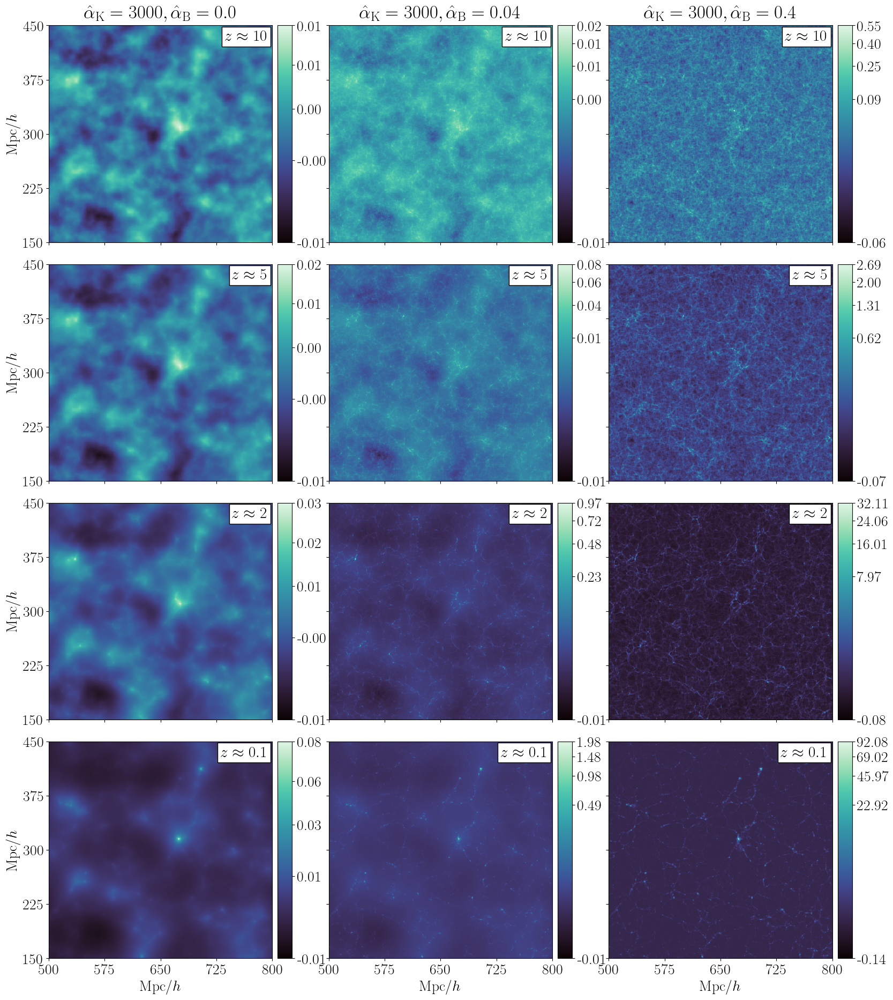

In [10]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import PowerNorm, LogNorm
from matplotlib.cm import get_cmap
from matplotlib.ticker import FormatStrFormatter

# ---- parameters ----
Ngrid     = 1200
boxsize   = 800
cmap_de   = "mako"
cmap_m    = "hot"
redshifts = [10, 5, 2, 0.08]


# ---- global figure settings ----
plt.rcParams.update({
    'pdf.fonttype': 42,
    'ps.fonttype': 42,
})
plt.rc("text", usetex=True)
plt.rc("font", family="serif", size=25)
plt.rc('xtick', labelsize=20)
plt.rc('ytick', labelsize=20)

fig, axes = plt.subplots(
    nrows=len(redshifts), ncols=3,
    figsize=(18, 20),
    sharey="row", sharex="col",
)
plt.subplots_adjust(
    wspace=0.04, hspace=0.1,
    top=0.95, bottom=0.08,
    left=0.06, right=0.92,
)

# grid coordinates
x = np.linspace(0, boxsize, Ngrid+1)
y = np.linspace(0, boxsize, Ngrid+1)

for i, z in enumerate(redshifts):
    # choose gamma
    if z in (10, 5, 2):
        gamma_val = 0.3
    else:
        gamma_val = 0.25

    # background density
    rho_bg = (rho_smg_f(z)/rho_crit_f(0)) * (1/(1+z))**3

    # common zoom limits & ticks
    x0, x1 = 500, 800
    y0, y1 = 150, 450
    xt = np.linspace(x0, x1, 5)
    yt = np.linspace(y0, y1, 5)

    # --- column 0: k-essence ---
    ax0 = axes[i, 0]
    zi_kess = dark_snapshots_kess[i]['data'][:Ngrid, :Ngrid, 20] / rho_bg 
    mesh0 = ax0.pcolormesh(
        x, y, zi_kess,
        cmap=get_cmap(cmap_de),
        norm=PowerNorm(gamma=0.7,
                       vmin=zi_kess.min(),
                       vmax=zi_kess.max()),
        shading='auto', rasterized=True
    )
    if i == 0:
        ax0.set_title(r"$\hat{\alpha}_\mathrm{K} = 3000, \hat{\alpha}_\mathrm{B} = 0.0$", fontsize=25, pad=10)
    ax0.set_xlim(x0, x1)
    ax0.set_ylim(y0, y1)
    ax0.set_xticks(xt)
    ax0.set_yticks(yt)
    z_display = 0.1 if np.isclose(z, 0.08) else z
    ax0.text(
        0.98, 0.98, fr"$z\approx{z_display}$",
        transform=ax0.transAxes,
        bbox={"facecolor":"white","pad":4,"edgecolor":"black"},
        ha="right", va="top", fontsize=21
    )
    ticks = np.linspace(zi_kess.min(), zi_kess.max(), 5)
    cbar = plt.colorbar(
        mesh0, ax=ax0,
        orientation='vertical',
        ticks=ticks,
        format="%.2f",
        pad=0.02, shrink=1, aspect=15,
    )


    # --- column 1: KGB1 ---
    ax1 = axes[i, 1]
    zi_kgb1 = dark_snapshots_kgb1[i]['data'][:Ngrid, :Ngrid, 20] / rho_bg 
    mesh1 = ax1.pcolormesh(
        x, y, zi_kgb1,
        cmap=get_cmap(cmap_de),
        norm=PowerNorm(gamma=gamma_val,
                       vmin=zi_kgb1.min(),
                       vmax=zi_kgb1.max()),
        shading='auto', rasterized=True
    )
    if i == 0:
        ax1.set_title(r"$\hat{\alpha}_\mathrm{K} = 3000, \hat{\alpha}_\mathrm{B} = 0.04$", fontsize=25, pad=10)
    ax1.set_xlim(x0, x1)
    ax1.set_ylim(y0, y1)
    ax1.set_xticks(xt)
    ax1.set_yticks(yt)
    z_display = 0.1 if np.isclose(z, 0.08) else z
    ax1.text(
        0.98, 0.98, fr"$z\approx{z_display}$",
        transform=ax1.transAxes,
        bbox={"facecolor":"white","pad":4,"edgecolor":"black"},
        ha="right", va="top", fontsize=21
    )
    ticks = np.linspace(zi_kgb1.min(), zi_kgb1.max(), 5)
    cbar = plt.colorbar(
        mesh1, ax=ax1,
        orientation='vertical',
        ticks=ticks,
        format="%.2f",
        pad=0.02, shrink=1, aspect=15,
    )

    


    # --- column 2: KGB2 ---
    ax2 = axes[i, 2]
    zi_kgb2 = dark_snapshots_kgb2[i]['data'][:Ngrid, :Ngrid, 20] / rho_bg 
    mesh2 = ax2.pcolormesh(
        x, y, zi_kgb2,
        cmap=get_cmap(cmap_de),
        norm=PowerNorm(gamma=gamma_val,
                       vmin=zi_kgb2.min(),
                       vmax=zi_kgb2.max()),
        shading='auto', rasterized=True
    )
    if i == 0:
        ax2.set_title(r"$\hat{\alpha}_\mathrm{K} = 3000, \hat{\alpha}_\mathrm{B} = 0.4$", fontsize=25, pad=10)
    ax2.set_xlim(x0, x1)
    ax2.set_ylim(y0, y1)
    ax2.set_xticks(xt)
    ax2.set_yticks(yt)
    z_display = 0.1 if np.isclose(z, 0.08) else z
    ax2.text(
        0.98, 0.98, fr"$z\approx{z_display}$",
        transform=ax2.transAxes,
        bbox={"facecolor":"white","pad":4,"edgecolor":"black"},
        ha="right", va="top", fontsize=21
    )
    ticks = np.linspace(zi_kgb2.min(), zi_kgb2.max(), 5)
    cbar = plt.colorbar(
        mesh2, ax=ax2,
        orientation='vertical',
        ticks=ticks,
        format="%.2f",
        pad=0.02, shrink=1, aspect=15,
    )

    
    


# only bottom row gets x‐labels
for ax in axes[-1, :]:
    ax.set_xlabel("Mpc/$h$", fontsize=20)
# only first column gets y‐labels
for ax in axes[:, 0]:
    ax.set_ylabel("Mpc/$h$", fontsize=20)

save_fig("snapshots_DE_zoomed")
plt.show()

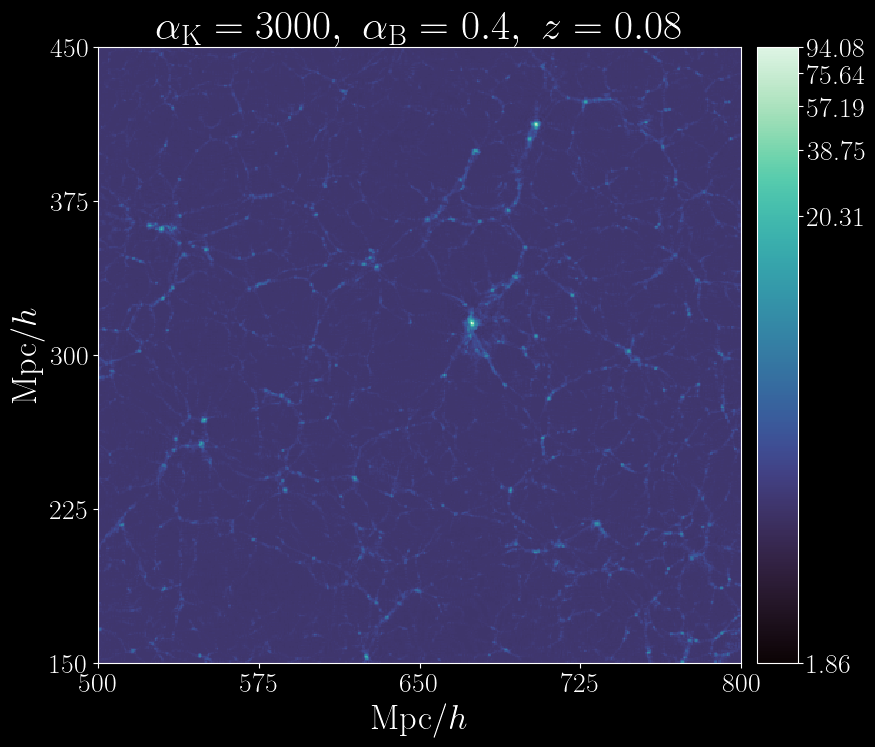

In [219]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import PowerNorm
from matplotlib.cm import get_cmap
from matplotlib.ticker import MaxNLocator

# … assume Ngrid, x, y, cmap_de, dark_snapshots_kgb2, rho_smg_f, rho_crit_f defined …

# pick z‐slice
z = 0.08
rho_bg = (rho_smg_f(z)/rho_crit_f(0)) * (1/(1+z))**3
zi = dark_snapshots_kgb2[3]['data'][:Ngrid, :Ngrid, 20] / rho_bg + 2

# plot with PowerNorm to boost structure
gamma_val = 0.2
fig, ax = plt.subplots(figsize=(10, 8))
mesh = ax.pcolormesh(
    x, y, zi,
    cmap=get_cmap(cmap_de),
    norm=PowerNorm(gamma=gamma_val, vmin=zi.min(), vmax=zi.max()),
    shading='auto', rasterized=True
)

# OPTION A: explicit ticks from true vmin→vmax
ticks = np.linspace(zi.min(), zi.max(), 6)
cbar = plt.colorbar(
    mesh, ax=ax,
    orientation='vertical',
    ticks=ticks,
    format="%.2f",
    pad=0.02, shrink=1, aspect=15,
)

# # OPTION B: let MaxNLocator pick “nice” ticks, but clipped to [vmin,vmax]
# cbar = plt.colorbar(mesh, ax=ax,
#                     orientation='vertical',
#                     pad=0.02, shrink=1, aspect=15)
# cbar.locator = MaxNLocator(nbins=6)
# cbar.update_ticks()

# zoom & labels
x0, x1 = 500, 800
y0, y1 = 150, 450
ax.set_xlim(x0, x1)
ax.set_ylim(y0, y1)
ax.set_xticks(np.linspace(x0, x1, 5))
ax.set_yticks(np.linspace(y0, y1, 5))
ax.set_xlabel("Mpc/$h$")
ax.set_ylabel("Mpc/$h$")
ax.set_title(r"$\alpha_\mathrm{K}=3000,\ \alpha_\mathrm{B}=0.4,\ z=0.08$")

plt.show()


Saving figure snapshots_DE_zoomed_z5


/tmp/ipykernel_38833/2016058006.py:45: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "optimize" which is no longer supported as of 3.3 and will become an error in 3.6
  plt.savefig(path,
/tmp/ipykernel_38833/2016058006.py:45: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "rasterized" which is no longer supported as of 3.3 and will become an error in 3.6
  plt.savefig(path,


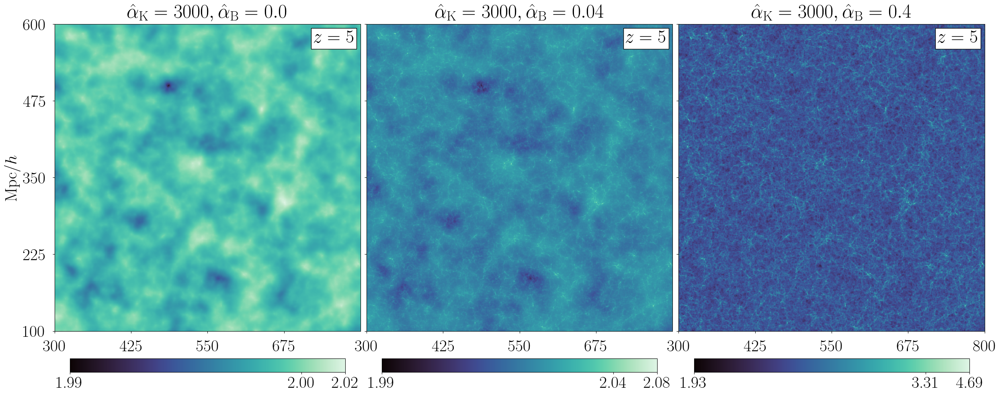

In [213]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import PowerNorm
from matplotlib.cm import get_cmap

# ---- parameters ----
Ngrid   = 1200
boxsize = 800
cmap_de  = "mako"
# only one redshift
z = 5


# ---- global figure settings ----
plt.rcParams.update({
    'pdf.fonttype': 42,
    'ps.fonttype': 42,
})
plt.rc("text", usetex=True)
plt.rc("font", family="serif", size=25)
plt.rc('xtick', labelsize=30)
plt.rc('ytick', labelsize=30)

# create one row with three columns, share y-axis
fig, axes = plt.subplots(
    nrows=1, ncols=3,
    figsize=(26, 14),
    sharey=True,
)
plt.subplots_adjust(
    wspace=0.02, hspace=0.0,
    top=0.9, bottom=0.20,
    left=0.06, right=0.95,
)

# grid coordinates and zoom region
x = np.linspace(0, boxsize, Ngrid)
y = np.linspace(0, boxsize, Ngrid)
x0, x1 = 300, 800
y0, y1 = 100, 600
xt = np.linspace(x0, x1, 5)
yt = np.linspace(y0, y1, 5)


circle_center = (675, 316)   # in Mpc/h
circle_radius = 35           # in Mpc/h

# compute background density
rho_bg = (rho_smg_f(z)/rho_crit_f(0)) * (1/(1+z))**3

# list of snapshot datasets and titles
datasets = [
    (dark_snapshots_kess, r"$\hat{\alpha}_\mathrm{K}=3000,\hat{\alpha}_\mathrm{B}=0.0$"),
    (dark_snapshots_kgb1, r"$\hat{\alpha}_\mathrm{K}=3000,\hat{\alpha}_\mathrm{B}=0.04$"),
    (dark_snapshots_kgb2, r"$\hat{\alpha}_\mathrm{K}=3000,\hat{\alpha}_\mathrm{B}=0.4$")
]

for ax, (data_list, title) in zip(axes, datasets):
    # extract and normalize slice
    zi = data_list[0]['data'][:Ngrid, :Ngrid, 20] / rho_bg + 2

    mesh = ax.pcolormesh(
        x, y, zi,
        cmap=get_cmap(cmap_de),
        norm=PowerNorm(gamma=0.25, vmin=zi.min(), vmax=zi.max()),
        shading='nearest', rasterized=True
    )
    
#     # overlay semi-transparent red circle
#     circle = plt.Circle(
#         circle_center, circle_radius,
#         edgecolor='red', facecolor='red', alpha=0.2,
#         linewidth=2
#     )
#     ax.add_patch(circle)
    
    
    ax.set_title(title, fontsize=35, pad=12)
    ax.set_xlim(x0, x1)
    ax.set_ylim(y0, y1)
    ax.set_xticks(xt)
    ax.set_yticks(yt)
    ax.text(
        0.98, 0.98, f"$z={z}$",
        transform=ax.transAxes,
        bbox={"facecolor":"white","pad":4,"edgecolor":"black"},
        ha="right", va="top", fontsize=33
    )
    # add horizontal colorbar below each
    
    ticks = np.linspace(zi.min(), zi.max(), 3)
    
    cbar = fig.colorbar(
        mesh, ax=ax,
        ticks = ticks,
        orientation='horizontal',
        pad=0.07, shrink=0.9,
        format="%.2f",
    )
    cbar.ax.xaxis.set_major_formatter(FormatStrFormatter('%.2f'))

# after you’ve defined xt = np.linspace(x0, x1, 5)…
for i, ax in enumerate(axes):
    # for all but the last panel, remove the final tick value
    if i < len(axes)-1:
        ax.set_xticks(xt[:-1])
    else:
        ax.set_xticks(xt)    
        
for ax in axes.ravel():
    ax.tick_params(axis='both', which='major', pad=12)
    
# labels
axes[0].set_ylabel("Mpc/$h$", fontsize=30)

save_fig("snapshots_DE_zoomed_z5")
plt.show()

Saving figure snapshots_DE_zoomed_z2


/tmp/ipykernel_38833/2016058006.py:45: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "optimize" which is no longer supported as of 3.3 and will become an error in 3.6
  plt.savefig(path,
/tmp/ipykernel_38833/2016058006.py:45: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "rasterized" which is no longer supported as of 3.3 and will become an error in 3.6
  plt.savefig(path,


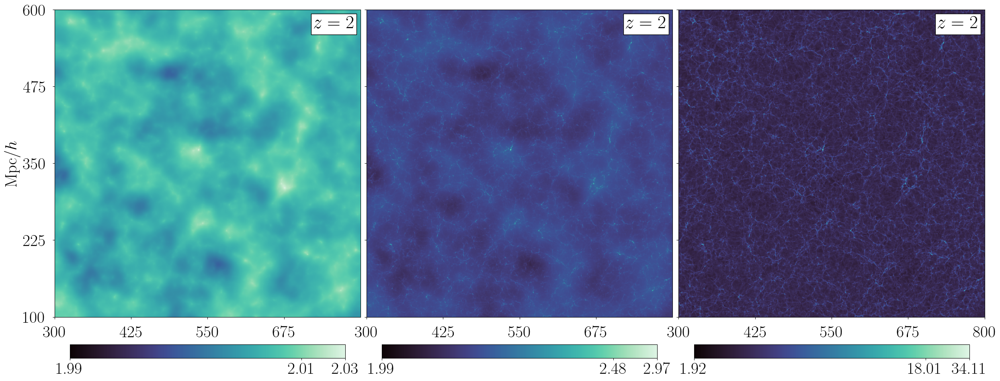

In [211]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import PowerNorm
from matplotlib.cm import get_cmap

# ---- parameters ----
Ngrid   = 1200
boxsize = 800
cmap_de  = "mako"
# only one redshift
z = 2

# ---- global figure settings ----
plt.rcParams.update({
    'pdf.fonttype': 42,
    'ps.fonttype': 42,
})
plt.rc("text", usetex=True)
plt.rc("font", family="serif", size=25)
plt.rc('xtick', labelsize=30)
plt.rc('ytick', labelsize=30)

# create one row with three columns, share y-axis
fig, axes = plt.subplots(
    nrows=1, ncols=3,
    figsize=(26, 14),
    sharey=True,
)
plt.subplots_adjust(
    wspace=0.02, hspace=0.0,
    top=0.9, bottom=0.20,
    left=0.06, right=0.95,
)

# grid coordinates and zoom region
x = np.linspace(0, boxsize, Ngrid)
y = np.linspace(0, boxsize, Ngrid)
x0, x1 = 300, 800
y0, y1 = 100, 600
xt = np.linspace(x0, x1, 5)
yt = np.linspace(y0, y1, 5)




# compute background density
rho_bg = (rho_smg_f(z)/rho_crit_f(0)) * (1/(1+z))**3

# list of snapshot datasets and titles
datasets = [
    (dark_snapshots_kess, r"$\alpha_\mathrm{K}=3000,\alpha_\mathrm{B}=0.0$"),
    (dark_snapshots_kgb1, r"$\alpha_\mathrm{K}=3000,\alpha_\mathrm{B}=0.04$"),
    (dark_snapshots_kgb2, r"$\alpha_\mathrm{K}=3000,\alpha_\mathrm{B}=0.4$")
]

for ax, (data_list, title) in zip(axes, datasets):
    # extract and normalize slice
    zi = data_list[1]['data'][:Ngrid, :Ngrid, 20] / rho_bg + 2

    mesh = ax.pcolormesh(
        x, y, zi,
        cmap=get_cmap(cmap_de),
        norm=PowerNorm(gamma=0.25, vmin=zi.min(), vmax=zi.max()),
        shading='nearest', rasterized=True
    )
    
#     # overlay semi-transparent red circle
#     circle = plt.Circle(
#         circle_center, circle_radius,
#         edgecolor='red', facecolor='red', alpha=0.2,
#         linewidth=2
#     )
#     ax.add_patch(circle)
    
    #ax.set_title(title, fontsize=35, pad=8)
    ax.set_xlim(x0, x1)
    ax.set_ylim(y0, y1)
    ax.set_xticks(xt)
    ax.set_yticks(yt)
    ax.text(
        0.98, 0.98, f"$z={z}$",
        transform=ax.transAxes,
        bbox={"facecolor":"white","pad":4,"edgecolor":"black"},
        ha="right", va="top", fontsize=33
    )
    # add horizontal colorbar below each
    
    ticks = np.linspace(zi.min(), zi.max(), 3)
    
    cbar = fig.colorbar(
        mesh, ax=ax,
        ticks = ticks,
        orientation='horizontal',
        pad=0.07, shrink=0.9,
        format="%.2f",
        
    )
    cbar.ax.xaxis.set_major_formatter(FormatStrFormatter('%.2f'))

# after you’ve defined xt = np.linspace(x0, x1, 5)…
for i, ax in enumerate(axes):
    # for all but the last panel, remove the final tick value
    if i < len(axes)-1:
        ax.set_xticks(xt[:-1])
    else:
        ax.set_xticks(xt)    
    
        
for ax in axes.ravel():
    ax.tick_params(axis='both', which='major', pad=12)
    
# labels
axes[0].set_ylabel("Mpc/$h$", fontsize=30)


save_fig("snapshots_DE_zoomed_z2")
plt.show()

Saving figure snapshots_DE_zoomed_z0p8


/tmp/ipykernel_38833/2016058006.py:45: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "optimize" which is no longer supported as of 3.3 and will become an error in 3.6
  plt.savefig(path,
/tmp/ipykernel_38833/2016058006.py:45: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "rasterized" which is no longer supported as of 3.3 and will become an error in 3.6
  plt.savefig(path,


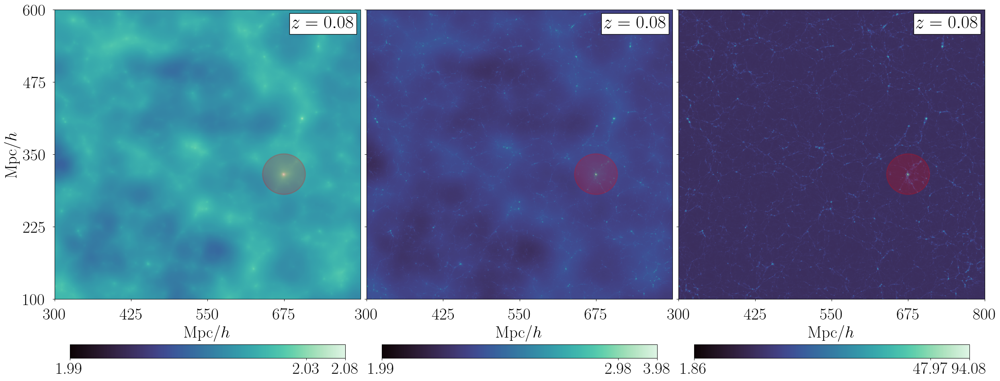

In [212]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import PowerNorm
from matplotlib.cm import get_cmap

# ---- parameters ----
Ngrid   = 1200
boxsize = 800
cmap_de  = "mako"
# only one redshift
z = 0.08

# ---- global figure settings ----
plt.rcParams.update({
    'pdf.fonttype': 42,
    'ps.fonttype': 42,
})
plt.rc("text", usetex=True)
plt.rc("font", family="serif", size=25)
plt.rc('xtick', labelsize=30)
plt.rc('ytick', labelsize=30)

# create one row with three columns, share y-axis
fig, axes = plt.subplots(
    nrows=1, ncols=3,
    figsize=(26, 14),
    sharey=True,
)
plt.subplots_adjust(
    wspace=0.02, hspace=0.0,
    top=0.9, bottom=0.20,
    left=0.06, right=0.95,
)

# grid coordinates and zoom region
x = np.linspace(0, boxsize, Ngrid)
y = np.linspace(0, boxsize, Ngrid)
x0, x1 = 300, 800
y0, y1 = 100, 600
xt = np.linspace(x0, x1, 5)
yt = np.linspace(y0, y1, 5)




# compute background density
rho_bg = (rho_smg_f(z)/rho_crit_f(0)) * (1/(1+z))**3

# list of snapshot datasets and titles
datasets = [
    (dark_snapshots_kess, r"$\alpha_\mathrm{K}=3000,\alpha_\mathrm{B}=0.0$"),
    (dark_snapshots_kgb1, r"$\alpha_\mathrm{K}=3000,\alpha_\mathrm{B}=0.04$"),
    (dark_snapshots_kgb2, r"$\alpha_\mathrm{K}=3000,\alpha_\mathrm{B}=0.4$")
]

for ax, (data_list, title) in zip(axes, datasets):
    # extract and normalize slice
    zi = data_list[-1]['data'][:Ngrid, :Ngrid, 20] / rho_bg + 2

    mesh = ax.pcolormesh(
        x, y, zi,
        cmap=get_cmap(cmap_de),
        norm=PowerNorm(gamma=0.22, vmin=zi.min(), vmax=zi.max()),
        shading='nearest', rasterized=True
    )
    
    # overlay semi-transparent red circle
    circle = plt.Circle(
        circle_center, circle_radius,
        edgecolor='red', facecolor='red', alpha=0.2,
        linewidth=2
    )
    ax.add_patch(circle)
    
    
    #ax.set_title(title, fontsize=35, pad=8)
    ax.set_xlim(x0, x1)
    ax.set_ylim(y0, y1)
    ax.set_xticks(xt)
    ax.set_yticks(yt)
    ax.text(
        0.98, 0.98, f"$z={z}$",
        transform=ax.transAxes,
        bbox={"facecolor":"white","pad":4,"edgecolor":"black"},
        ha="right", va="top", fontsize=33
    )
    # add horizontal colorbar below each
    
    ticks = np.linspace(zi.min(), zi.max(), 3)
    
    cbar = fig.colorbar(
        mesh, ax=ax,
        ticks = ticks,
        orientation='horizontal',
        pad=0.115, shrink=0.9,
        format="%.2f"
    )
    cbar.ax.xaxis.set_major_formatter(FormatStrFormatter('%.2f'))

# after you’ve defined xt = np.linspace(x0, x1, 5)…
for i, ax in enumerate(axes):
    # for all but the last panel, remove the final tick value
    if i < len(axes)-1:
        ax.set_xticks(xt[:-1])
    else:
        ax.set_xticks(xt)    
        
for ax in axes.ravel():
    ax.tick_params(axis='both', which='major', pad=12)
    
# labels
axes[0].set_ylabel("Mpc/$h$", fontsize=30)
for ax in axes:
    ax.set_xlabel("Mpc/$h$", fontsize=30)

save_fig("snapshots_DE_zoomed_z0p8")
plt.show()
